# Mention Network: Top 20 Twitch Streamers

## Goal
Build a **directed mention network** where:
- **Edge A → B**: Chat messages in streamer A's channel mention streamer B
- **Edge weight**: Number of mentions
- **Analysis**: Shows cross-community awareness and discussion

### Strategy
1. Load top 20 streamers from `twitchtracker_top500.csv`
2. Get 3 VODs per streamer via Twitch API
3. Download chat logs using TwitchDownloaderCLI
4. Parse chats to find mentions of other top 20 streamers
5. Build directed mention network
6. Analyze: Which streamers get mentioned most? Are there community clusters?

## Step 1: Setup and Import Libraries

In [3]:
# Import required libraries
import pandas as pd
import numpy as np
import networkx as nx
import requests
import json
import time
import subprocess
import threading
from concurrent.futures import ThreadPoolExecutor, as_completed
from pathlib import Path
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
from datetime import datetime
import re

print("✓ Libraries imported")

✓ Libraries imported


## Step 2: Configuration

In [4]:
# Configuration
TOP_N = 500  # Number of top streamers to analyze
VIDEOS_PER_STREAMER = 1  # VODs to download per streamer
MIN_VOD_DURATION_MINUTES = 30  # Minimum VOD length to prefer
MIN_VOD_DURATION_SECONDS = MIN_VOD_DURATION_MINUTES * 60
TARGET_YEAR = 2025  # Only consider VODs created in this year

# Twitch API Credentials
TWITCH_CLIENT_ID = "2hf713pofj3m7pw6l54k27ev3070g8"
TWITCH_CLIENT_SECRET = "oayn1tenhsbbzpnkumai5uibw4la7t"

# Directories
CHAT_DIR = Path('mention_network_chats')
CHAT_DIR.mkdir(exist_ok=True)

print(f"Configuration:")
print(f"  Top streamers: {TOP_N}")
print(f"  Videos per streamer: {VIDEOS_PER_STREAMER}")
print(f"  Preferred minimum VOD length: {MIN_VOD_DURATION_MINUTES} minutes")
print(f"  Target year: {TARGET_YEAR}")
print(f"  Chat directory: {CHAT_DIR}")
print(f"  Total VODs to download: {TOP_N * VIDEOS_PER_STREAMER}")

Configuration:
  Top streamers: 500
  Videos per streamer: 1
  Preferred minimum VOD length: 30 minutes
  Target year: 2025
  Chat directory: mention_network_chats
  Total VODs to download: 500


## Step 3: Load Top 20 Streamers from TwitchTracker CSV

In [5]:
# Load TwitchTracker data
df = pd.read_csv('twitchtracker_top500.csv')

# Take top 20 streamers by rank
top_streamers_df = df.head(TOP_N).copy()

print(f"Top {TOP_N} Streamers from TwitchTracker:")
print("="*80)
print(top_streamers_df[['rank', 'display_name', 'login', 'avg_viewers', 'total_followers']].to_string())
print("="*80)

# Create sets for mention detection (case-insensitive)
streamer_logins = set(top_streamers_df['login'].str.lower())
streamer_display_names = set(top_streamers_df['display_name'].str.lower())
all_streamer_names = streamer_logins | streamer_display_names

# Create mapping from name to login (for network nodes)
name_to_login = {}
for _, row in top_streamers_df.iterrows():
    login = row['login'].lower()
    name_to_login[login] = login
    name_to_login[row['display_name'].lower()] = login

print(f"\n✓ Loaded {len(top_streamers_df)} streamers")
print(f"✓ Will detect mentions of: {', '.join(list(streamer_logins)[:10])}...")

Top 500 Streamers from TwitchTracker:
     rank        display_name               login  avg_viewers total_followers
0       1             Caedrel             caedrel       101595         1430249
1       2        jasontheween        jasontheween        17357         1886454
2       3           zackrawrr           zackrawrr        42106         2178353
3       4       stableronaldo       stableronaldo        13524         4264194
4       5             caseoh_             caseoh_        52190         7763960
5       6                Lacy                lacy        12061         2036404
6       7              shroud              shroud        21488        11294230
7       8            HasanAbi            hasanabi        29587         2960421
8       9          Riot Games           riotgames        43429         7345356
9      10              Jynxzi              jynxzi        26908         8298146
10     11      yourragegaming      yourragegaming         9708         1855286
11     12     

## Step 4: Twitch API Helper Class

In [6]:
class TwitchAPI:
    def __init__(self, client_id, client_secret):
        self.client_id = client_id
        self.client_secret = client_secret
        self.access_token = None
        self.base_url = "https://api.twitch.tv/helix"
        self.get_access_token()
    
    def get_access_token(self):
        """Get OAuth token from Twitch"""
        url = "https://id.twitch.tv/oauth2/token"
        params = {
            'client_id': self.client_id,
            'client_secret': self.client_secret,
            'grant_type': 'client_credentials'
        }
        response = requests.post(url, params=params)
        response.raise_for_status()
        self.access_token = response.json()['access_token']
        return True
    
    def _get_headers(self):
        """Get headers for API requests"""
        return {
            'Client-ID': self.client_id,
            'Authorization': f'Bearer {self.access_token}'
        }
    
    def get_user_id(self, login):
        """Get user ID from login name"""
        url = f"{self.base_url}/users?login={login}"
        response = requests.get(url, headers=self._get_headers())
        response.raise_for_status()
        data = response.json()['data']
        return data[0]['id'] if data else None
    
    def get_user_videos(self, user_id, max_videos=10):
        """Get VODs for a user"""
        url = f"{self.base_url}/videos?user_id={user_id}&first={min(max_videos, 100)}&type=archive"
        response = requests.get(url, headers=self._get_headers())
        response.raise_for_status()
        return response.json()['data']

# Initialize API
api = TwitchAPI(TWITCH_CLIENT_ID, TWITCH_CLIENT_SECRET)
print("✓ TwitchAPI initialized and authenticated")

✓ TwitchAPI initialized and authenticated


## Step 5: Get User IDs and VODs for Each Streamer

In [7]:
# Get user IDs for all streamers
print("Fetching user IDs...\n")

streamer_data = {}

for idx, row in top_streamers_df.iterrows():
    login = row['login']
    
    try:
        user_id = api.get_user_id(login)
        if user_id:
            streamer_data[login] = {
                'user_id': user_id,
                'display_name': row['display_name'],
                'rank': row['rank']
            }
            print(f"  ✓ {row['display_name']:20s} (ID: {user_id})")
        else:
            print(f"  ✗ {row['display_name']:20s} - Not found")
        
        time.sleep(0.1)
    except Exception as e:
        print(f"  ✗ {row['display_name']:20s} - Error: {e}")

print(f"\n✓ Got user IDs for {len(streamer_data)} streamers")

Fetching user IDs...

  ✓ Caedrel              (ID: 92038375)
  ✓ Caedrel              (ID: 92038375)
  ✓ jasontheween         (ID: 107117952)
  ✓ jasontheween         (ID: 107117952)
  ✓ zackrawrr            (ID: 552120296)
  ✓ zackrawrr            (ID: 552120296)
  ✓ stableronaldo        (ID: 246450563)
  ✓ stableronaldo        (ID: 246450563)
  ✓ caseoh_              (ID: 267160288)
  ✓ caseoh_              (ID: 267160288)
  ✓ Lacy                 (ID: 494543675)
  ✓ Lacy                 (ID: 494543675)
  ✓ shroud               (ID: 37402112)
  ✓ shroud               (ID: 37402112)
  ✓ HasanAbi             (ID: 207813352)
  ✓ HasanAbi             (ID: 207813352)
  ✓ Riot Games           (ID: 36029255)
  ✓ Riot Games           (ID: 36029255)
  ✓ Jynxzi               (ID: 411377640)
  ✓ Jynxzi               (ID: 411377640)
  ✓ yourragegaming       (ID: 36926489)
  ✓ yourragegaming       (ID: 36926489)
  ✓ PrimeVideo           (ID: 168843586)
  ✓ PrimeVideo           (ID: 168843586)
  

In [8]:
# Get VODs for each streamer
print(f"\nFetching {VIDEOS_PER_STREAMER} VODs per streamer (>= {MIN_VOD_DURATION_MINUTES} minutes when possible, year {TARGET_YEAR})...\n")

def parse_twitch_duration(duration_str):
    """Convert Twitch duration string (e.g., '2h3m4s') to total seconds."""
    total_seconds = 0
    number = ''
    for char in duration_str.lower():
        if char.isdigit():
            number += char
        else:
            if number:
                value = int(number)
                if char == 'h':
                    total_seconds += value * 3600
                elif char == 'm':
                    total_seconds += value * 60
                elif char == 's':
                    total_seconds += value
            number = ''
    return total_seconds

def parse_twitch_datetime(timestamp_str):
    """Parse Twitch ISO8601 timestamps (with trailing Z)."""
    try:
        if timestamp_str.endswith('Z'):
            timestamp_str = timestamp_str[:-1] + '+00:00'
        return datetime.fromisoformat(timestamp_str)
    except Exception:
        return None

all_vods = []
streamers_with_vods = 0
streamers_without_vods = []
no_year_vods = []
used_fallback_vods = []

for login, data in streamer_data.items():
    user_id = data['user_id']
    display_name = data['display_name']

    try:
        videos = api.get_user_videos(user_id, max_videos=100)

        eligible_videos = []
        best_short_video = None

        for video in videos:
            duration_seconds = parse_twitch_duration(video['duration'])
            created_at_dt = parse_twitch_datetime(video['created_at'])

            if created_at_dt and created_at_dt.year == TARGET_YEAR:
                if duration_seconds >= MIN_VOD_DURATION_SECONDS:
                    eligible_videos.append((video, duration_seconds, created_at_dt))
                    if len(eligible_videos) >= VIDEOS_PER_STREAMER:
                        break
                else:
                    if best_short_video is None or duration_seconds > best_short_video[1]:
                        best_short_video = (video, duration_seconds, created_at_dt)

        selected_videos = []
        if eligible_videos:
            selected_videos = eligible_videos[:VIDEOS_PER_STREAMER]
        elif best_short_video:
            selected_videos = [best_short_video]
            used_fallback_vods.append(display_name)
        else:
            no_year_vods.append(display_name)

        if selected_videos:
            streamers_with_vods += 1
            for video, duration_seconds, created_at_dt in selected_videos:
                all_vods.append({
                    'streamer_login': login,
                    'streamer_name': display_name,
                    'streamer_id': user_id,
                    'video_id': video['id'],
                    'video_url': video['url'],
                    'title': video['title'],
                    'created_at': video['created_at'],
                    'created_at_iso': created_at_dt.isoformat() if created_at_dt else None,
                    'duration': video['duration'],
                    'duration_seconds': duration_seconds,
                    'view_count': video['view_count'],
                    'meets_duration': duration_seconds >= MIN_VOD_DURATION_SECONDS
                })
            label = "eligible" if selected_videos[0][1] >= MIN_VOD_DURATION_SECONDS else "fallback"
            print(f"  ✓ {display_name:20s}: {len(selected_videos)} {label} VOD(s)")
        else:
            print(f"  ✗ {display_name:20s}: No VODs in {TARGET_YEAR}")

        time.sleep(0.1)
    except Exception as e:
        streamers_without_vods.append(display_name)
        print(f"  ✗ {display_name:20s}: Error - {e}")

total_streamers = len(streamer_data)
print(f"\n{'='*80}")
print(f"VOD Collection Results:")
print(f"  Streamers with selected VODs: {streamers_with_vods}/{total_streamers}")
print(f"  Total VODs selected: {len(all_vods)}")
print(f"  Average VODs per streamer: {len(all_vods)/total_streamers:.2f}")
print(f"{'='*80}")

if used_fallback_vods:
    print(f"\nStreamers using <{MIN_VOD_DURATION_MINUTES} minute fallback ({len(used_fallback_vods)}):")
    print(', '.join(used_fallback_vods[:30]) + ('...' if len(used_fallback_vods) > 30 else ''))

if no_year_vods:
    print(f"\nStreamers without {TARGET_YEAR} VODs ({len(no_year_vods)}):")
    print(', '.join(no_year_vods[:30]) + ('...' if len(no_year_vods) > 30 else ''))

if streamers_without_vods:
    print(f"\nStreamers with API errors ({len(streamers_without_vods)}):")
    print(', '.join(streamers_without_vods[:30]) + ('...' if len(streamers_without_vods) > 30 else ''))

if all_vods:
    # Save VOD list
    vods_df = pd.DataFrame(all_vods)
    vods_df.to_csv('mention_network_vods.csv', index=False)
    print("\n✓ Saved VOD list to 'mention_network_vods.csv'")
else:
    print("\n⚠️ No eligible VODs found!")


Fetching 1 VODs per streamer (>= 30 minutes when possible, year 2025)...

  ✓ Caedrel             : 1 eligible VOD(s)
  ✓ Caedrel             : 1 eligible VOD(s)
  ✓ jasontheween        : 1 eligible VOD(s)
  ✓ jasontheween        : 1 eligible VOD(s)
  ✓ zackrawrr           : 1 eligible VOD(s)
  ✓ zackrawrr           : 1 eligible VOD(s)
  ✓ stableronaldo       : 1 eligible VOD(s)
  ✓ stableronaldo       : 1 eligible VOD(s)
  ✓ caseoh_             : 1 eligible VOD(s)
  ✓ caseoh_             : 1 eligible VOD(s)
  ✓ Lacy                : 1 eligible VOD(s)
  ✓ Lacy                : 1 eligible VOD(s)
  ✓ shroud              : 1 eligible VOD(s)
  ✓ shroud              : 1 eligible VOD(s)
  ✓ HasanAbi            : 1 eligible VOD(s)
  ✓ HasanAbi            : 1 eligible VOD(s)
  ✓ Riot Games          : 1 eligible VOD(s)
  ✓ Riot Games          : 1 eligible VOD(s)
  ✓ Jynxzi              : 1 eligible VOD(s)
  ✓ Jynxzi              : 1 eligible VOD(s)
  ✓ yourragegaming      : 1 eligible VOD(s)
 

## Step 6: Download Chat Logs

**Requirements:**
- Download `TwitchDownloaderCLI.exe` from: https://github.com/lay295/TwitchDownloader/releases
- Place it in the Proj3 folder

Skip this step if you don't have the CLI tool yet.

In [9]:
# Check if TwitchDownloaderCLI exists
cli_path = Path('TwitchDownloaderCLI.exe')

if not cli_path.exists():
    print("⚠️ TwitchDownloaderCLI.exe not found!")
    print("\nTo download chat logs:")
    print("1. Go to: https://github.com/lay295/TwitchDownloader/releases")
    print("2. Download TwitchDownloaderCLI.exe")
    print("3. Place it in the Proj3 folder")
    print("4. Re-run this cell")
else:
    print(f"✓ Found TwitchDownloaderCLI at: {cli_path.absolute()}")
    print(f"\nReady to download {len(all_vods)} chat logs!")

✓ Found TwitchDownloaderCLI at: c:\Users\felix\Downloads\Proj3-20251105T115847Z-1-001\Proj3\TwitchDownloaderCLI.exe

Ready to download 474 chat logs!


In [10]:
# Download all chat logs
if cli_path.exists() and all_vods:
    total_vods = len(all_vods)
    print(f"Downloading chat logs for {total_vods} VODs...\n")
    print("This may take significant time depending on VOD lengths.\n")

    timeout_seconds = 1000  # ~16.7 minutes per download
    progress_interval = 30  # seconds between progress updates

    print_lock = threading.Lock()
    successful_downloads = []
    failed_downloads = []

    def log(prefix, message):
        with print_lock:
            print(f"{prefix} {message}", flush=True)

    def download_single(idx, vod):
        video_id = vod['video_id']
        streamer_name = vod['streamer_name']
        output_file = CHAT_DIR / f"{streamer_name}_{video_id}_chat.json"
        prefix = f"[{idx}/{total_vods}] {streamer_name:20s}"

        process = None
        output_thread = None

        try:
            log(prefix, f"⏳ Starting download - Video {video_id}")

            process = subprocess.Popen(
                [str(cli_path), 'chatdownload', '--id', video_id, '-o', str(output_file)],
                stdout=subprocess.PIPE,
                stderr=subprocess.STDOUT,
                text=True,
                bufsize=1
            )

            if process.stdout is None:
                raise RuntimeError("Unable to read TwitchDownloader output")

            def stream_output(pipe):
                for raw_line in iter(pipe.readline, ''):
                    cleaned_line = raw_line.replace('\r', '').strip()
                    if cleaned_line:
                        log(prefix, f"    {cleaned_line}")
                pipe.close()

            output_thread = threading.Thread(target=stream_output, args=(process.stdout,), daemon=True)
            output_thread.start()

            download_start = time.time()
            last_progress_report = download_start
            last_size_reported = -1.0

            while True:
                finished = process.poll()
                now = time.time()

                if finished is not None:
                    break

                if now - last_progress_report >= progress_interval:
                    if output_file.exists():
                        size_mb = output_file.stat().st_size / (1024 * 1024)
                        if size_mb > 0 and abs(size_mb - last_size_reported) >= 0.05:
                            last_size_reported = size_mb
                            log(prefix, f"    • Downloaded {size_mb:.2f} MB so far")
                    elapsed = now - download_start
                    log(prefix, f"    • Elapsed {elapsed:.1f}s")
                    last_progress_report = now

                if now - download_start > timeout_seconds:
                    process.kill()
                    raise subprocess.TimeoutExpired(process.args, timeout_seconds)

                time.sleep(0.5)

            return_code = process.wait()

            if return_code == 0 and output_file.exists():
                file_size = output_file.stat().st_size / 1024 / 1024
                log(prefix, f"  ✅ Success! Size: {file_size:.2f} MB")
                return ("success", vod, None)
            else:
                error_detail = f"exit code {return_code}"
                if output_file.exists():
                    partial_size = output_file.stat().st_size / 1024 / 1024
                    error_detail += f" (partial file {partial_size:.2f} MB)"
                log(prefix, f"  ❌ Failed: {error_detail}")
                return ("failed", vod, error_detail)

        except subprocess.TimeoutExpired:
            log(prefix, "  ❌ Timeout (took too long)")
            return ("failed", vod, "timeout")
        except Exception as e:
            log(prefix, f"  ❌ Error: {e}")
            return ("failed", vod, str(e))
        finally:
            if output_thread and output_thread.is_alive():
                output_thread.join(timeout=2)
            if process and process.poll() is None:
                process.kill()
                try:
                    process.wait(timeout=5)
                except subprocess.TimeoutExpired:
                    pass

    pending_tasks = []

    for idx, vod in enumerate(all_vods, 1):
        output_file = CHAT_DIR / f"{vod['streamer_name']}_{vod['video_id']}_chat.json"
        if output_file.exists():
            print(f"✓ [{idx}/{total_vods}] {vod['streamer_name']:20s} - Already downloaded (skipping)")
            successful_downloads.append(vod)
        else:
            pending_tasks.append((idx, vod))

    if pending_tasks:
        max_workers = min(4, len(pending_tasks))
        if max_workers <= 0:
            max_workers = 1

        with ThreadPoolExecutor(max_workers=max_workers) as executor:
            futures = [executor.submit(download_single, idx, vod) for idx, vod in pending_tasks]
            for future in as_completed(futures):
                status, vod, _ = future.result()
                if status == "success":
                    successful_downloads.append(vod)
                else:
                    failed_downloads.append(vod)
    else:
        print("No new chat logs need downloading.")

    print(f"\n{'='*80}")
    print("Download Summary:")
    print(f"  ✅ Successful: {len(successful_downloads)}/{total_vods}")
    print(f"  ❌ Failed: {len(failed_downloads)}/{total_vods}")
    print(f"{'='*80}")
else:
    print("⚠️ Skipping download (CLI not found or no VODs)")


This may take significant time depending on VOD lengths.

[1/474] Caedrel              ⏳ Starting download - Video 2607635484
[2/474] jasontheween         ⏳ Starting download - Video 2605358479
[3/474] zackrawrr            ⏳ Starting download - Video 2609733607
[4/474] stableronaldo        ⏳ Starting download - Video 2606266108
[2/474] jasontheween         ⏳ Starting download - Video 2605358479
[3/474] zackrawrr            ⏳ Starting download - Video 2609733607
[4/474] stableronaldo        ⏳ Starting download - Video 2606266108
[1/474] Caedrel                  TwitchDownloaderCLI 1.56.1 Copyright (c) lay295 and contributors
[3/474] zackrawrr                TwitchDownloaderCLI 1.56.1 Copyright (c) lay295 and contributors
[1/474] Caedrel                  TwitchDownloaderCLI 1.56.1 Copyright (c) lay295 and contributors
[3/474] zackrawrr                TwitchDownloaderCLI 1.56.1 Copyright (c) lay295 and contributors
[2/474] jasontheween             TwitchDownloaderCLI 1.56.1 Copyright (c)

## Step 7: Parse Chats and Extract Mentions

Now we'll go through each downloaded chat and look for mentions of the top 20 streamers.

In [11]:
# Parse all chat files and extract mentions
print("Parsing chat logs to find mentions...\n")

# Dictionary to store mentions: {(from_streamer, to_streamer): count}
mention_counts = defaultdict(int)

# Get all chat files
chat_files = list(CHAT_DIR.glob('*_chat.json'))

print(f"Found {len(chat_files)} chat files to analyze\n")

for i, chat_file in enumerate(chat_files, 1):
    # Extract streamer name from filename
    filename = chat_file.stem  # Remove .json
    parts = filename.split('_')
    source_streamer = parts[0].lower()  # First part is streamer name
    
    # Skip if not in our streamer list
    if source_streamer not in streamer_logins:
        continue
    
    try:
        with open(chat_file, 'r', encoding='utf-8') as f:
            chat_data = json.load(f)
        
        comments = chat_data.get('comments', [])
        
        # Count mentions in this chat
        local_mentions = Counter()
        
        for comment in comments:
            message = comment.get('message', {}).get('body', '').lower()
            
            # Look for mentions of any of our streamers
            for name in all_streamer_names:
                # Skip self-mentions
                if name == source_streamer:
                    continue
                
                # Check if streamer name appears in message
                # Use word boundaries to avoid partial matches
                pattern = r'\b' + re.escape(name) + r'\b'
                if re.search(pattern, message):
                    target_streamer = name_to_login[name]
                    local_mentions[target_streamer] += 1
        
        # Add to global counts
        for target, count in local_mentions.items():
            mention_counts[(source_streamer, target)] += count
        
        if local_mentions:
            total_mentions = sum(local_mentions.values())
            top_mentioned = local_mentions.most_common(3)
            print(f"[{i}/{len(chat_files)}] {source_streamer:15s}: {total_mentions:4d} mentions - Top: {dict(top_mentioned)}")
        else:
            print(f"[{i}/{len(chat_files)}] {source_streamer:15s}: No mentions found")
    
    except Exception as e:
        print(f"[{i}/{len(chat_files)}] {source_streamer:15s}: Error - {e}")

print(f"\n{'='*80}")
print(f"Mention Extraction Complete:")
print(f"  Total unique mention pairs: {len(mention_counts)}")
print(f"  Total mentions found: {sum(mention_counts.values()):,}")
print(f"{'='*80}")

Parsing chat logs to find mentions...

Found 473 chat files to analyze

[1/473] 2xrakai        :  365 mentions - Top: {'fanum': 167, 'ray': 81, 'duke': 50}
[1/473] 2xrakai        :  365 mentions - Top: {'fanum': 167, 'ray': 81, 'duke': 50}
[2/473] 39daph         :   59 mentions - Top: {'northernlion': 7, 'cyr': 7, 'lacari': 5}
[2/473] 39daph         :   59 mentions - Top: {'northernlion': 7, 'cyr': 7, 'lacari': 5}
[3/473] abdulhd        :    1 mentions - Top: {'tray': 1}
[3/473] abdulhd        :    1 mentions - Top: {'tray': 1}
[4/473] aceu           :   81 mentions - Top: {'shroud': 59, 'shrood': 7, 'fortnite': 5}
[4/473] aceu           :   81 mentions - Top: {'shroud': 59, 'shrood': 7, 'fortnite': 5}
[5/473] adapt          : 6601 mentions - Top: {'silky': 2362, 'lacy': 1845, 'kaysan': 1243}
[5/473] adapt          : 6601 mentions - Top: {'silky': 2362, 'lacy': 1845, 'kaysan': 1243}
[6/473] admiralbahroo  :    2 mentions - Top: {'ray': 1, 'smoke': 1}
[6/473] admiralbahroo  :    2 menti

## Step 8: Build Mention Network

In [12]:
# Build directed mention network
print("Building mention network...\n")

G = nx.DiGraph()

# Add all streamers as nodes
for login, data in streamer_data.items():
    G.add_node(
        login,
        display_name=data['display_name'],
        rank=data['rank']
    )

print(f"✓ Added {G.number_of_nodes()} nodes\n")

# Add edges for mentions
for (source, target), count in mention_counts.items():
    if source in G.nodes() and target in G.nodes():
        G.add_edge(source, target, weight=count, mentions=count)

print(f"✓ Added {G.number_of_edges()} edges\n")

# Network statistics
print(f"{'='*80}")
print(f"MENTION NETWORK Statistics:")
print(f"{'='*80}")
print(f"  Nodes: {G.number_of_nodes()}")
print(f"  Edges: {G.number_of_edges()}")
print(f"  Density: {nx.density(G):.4f}")
print(f"  Weakly connected: {nx.is_weakly_connected(G)}")

if G.number_of_edges() > 0:
    # In/Out degree
    in_degrees = dict(G.in_degree())
    out_degrees = dict(G.out_degree())
    
    print(f"\n  Average in-degree (mentioned by others): {np.mean(list(in_degrees.values())):.2f}")
    print(f"  Average out-degree (mentions others): {np.mean(list(out_degrees.values())):.2f}")
    
    # Most mentioned streamers
    most_mentioned = sorted(in_degrees.items(), key=lambda x: x[1], reverse=True)[:10]
    print(f"\n  Top 10 Most Mentioned Streamers:")
    for login, count in most_mentioned:
        if count > 0:
            name = G.nodes[login]['display_name']
            # Get total mentions
            total = sum(G[u][login]['mentions'] for u in G.predecessors(login))
            print(f"    {name:20s}: mentioned in {count} chats, {total:,} total mentions")
    
    # Chats with most outgoing mentions
    most_mentions_out = sorted(out_degrees.items(), key=lambda x: x[1], reverse=True)[:10]
    print(f"\n  Top 10 Chats Mentioning Others Most:")
    for login, count in most_mentions_out:
        if count > 0:
            name = G.nodes[login]['display_name']
            total = sum(G[login][v]['mentions'] for v in G.successors(login))
            print(f"    {name:20s}: mentions {count} other streamers, {total:,} total mentions")
else:
    print(f"\n  ⚠️ No mention relationships found!")

print(f"{'='*80}")

Building mention network...

✓ Added 497 nodes

✓ Added 6233 edges

MENTION NETWORK Statistics:
  Nodes: 497
  Edges: 6233
  Density: 0.0253
  Weakly connected: False

  Average in-degree (mentioned by others): 12.54
  Average out-degree (mentions others): 12.54

  Top 10 Most Mentioned Streamers:
    Smoke               : mentioned in 291 chats, 3,483 total mentions
    Fortnite            : mentioned in 255 chats, 3,465 total mentions
    Ninja               : mentioned in 196 chats, 1,458 total mentions
    Bugs                : mentioned in 190 chats, 791 total mentions
    Halo                : mentioned in 149 chats, 1,007 total mentions
    Bean                : mentioned in 148 chats, 1,186 total mentions
    Peter               : mentioned in 144 chats, 1,309 total mentions
    Ray                 : mentioned in 138 chats, 3,709 total mentions
    xQc                 : mentioned in 131 chats, 1,533 total mentions
    Chess               : mentioned in 123 chats, 1,121 total me

## Step 9: Analyze Top Mention Relationships

In [13]:
# Show top mention relationships
if G.number_of_edges() > 0:
    print("Top 20 Mention Relationships:\n")
    
    # Get all edges with weights
    edges_with_weights = []
    for u, v, data in G.edges(data=True):
        edges_with_weights.append((
            G.nodes[u]['display_name'],
            G.nodes[v]['display_name'],
            data['mentions']
        ))
    
    # Sort by mention count
    edges_with_weights.sort(key=lambda x: x[2], reverse=True)
    
    print(f"{'From Chat':<20} → {'Mentioned Streamer':<20} {'Mentions':>10}")
    print("="*55)
    for from_name, to_name, count in edges_with_weights[:20]:
        print(f"{from_name:<20} → {to_name:<20} {count:>10,}")
else:
    print("No mention relationships to display")

Top 20 Mention Relationships:

From Chat            → Mentioned Streamer     Mentions
Adapt                → Silky                     2,362
Adapt                → Lacy                      1,845
rayasianboy          → Ray                       1,835
Jynxzi               → Evo                       1,720
Adapt                → Kaysan                    1,243
Kaysan               → Silky                     1,196
DeshaeFrost          → DDG                         997
CohhCarnage          → Cohh                        886
DDG                  → Smoke                       775
Agent00              → Ray                         608
Kaysan               → Adapt                       541
Quin69               → forsen                      536
filian               → Grimmi                      495
Valkyrae             → Cinna                       469
Reginald             → Fanum                       467
Marlon               → Lacy                        465
MitchJones           → Bean       

## Step 10: Save Network

In [14]:
# Save the mention network
print("Saving mention network...\n")

# Save as GraphML
nx.write_graphml(G, 'mention_network_top20.graphml')
print("✓ Saved as GraphML (mention_network_top20.graphml)")

# Save as GML
nx.write_gml(G, 'mention_network_top20.gml')
print("✓ Saved as GML (mention_network_top20.gml)")

# Save edges CSV
if G.number_of_edges() > 0:
    edges_data = []
    for u, v, data in G.edges(data=True):
        edges_data.append({
            'source': u,
            'source_name': G.nodes[u]['display_name'],
            'target': v,
            'target_name': G.nodes[v]['display_name'],
            'mentions': data['mentions']
        })
    
    edges_df = pd.DataFrame(edges_data)
    edges_df.to_csv('mention_network_top20_edges.csv', index=False)
    print("✓ Saved edges (mention_network_top20_edges.csv)")

# Save nodes CSV
nodes_data = []
for node in G.nodes():
    nodes_data.append({
        'login': node,
        'display_name': G.nodes[node]['display_name'],
        'rank': G.nodes[node]['rank'],
        'in_degree': G.in_degree(node),
        'out_degree': G.out_degree(node),
        'total_mentioned': sum(G[u][node]['mentions'] for u in G.predecessors(node)) if G.in_degree(node) > 0 else 0,
        'total_mentions_out': sum(G[node][v]['mentions'] for v in G.successors(node)) if G.out_degree(node) > 0 else 0
    })

nodes_df = pd.DataFrame(nodes_data)
nodes_df.to_csv('mention_network_top20_nodes.csv', index=False)
print("✓ Saved nodes (mention_network_top20_nodes.csv)")

# Save metrics
metrics = {
    'network_type': 'mention',
    'num_streamers': TOP_N,
    'videos_per_streamer': VIDEOS_PER_STREAMER,
    'nodes': G.number_of_nodes(),
    'edges': G.number_of_edges(),
    'density': nx.density(G),
    'is_directed': True,
    'weakly_connected': nx.is_weakly_connected(G),
    'total_mentions': sum(data['mentions'] for _, _, data in G.edges(data=True)),
    'collection_date': datetime.now().isoformat()
}

with open('mention_network_top20_metrics.json', 'w') as f:
    json.dump(metrics, f, indent=2)

print("✓ Saved metrics (mention_network_top20_metrics.json)")

print(f"\n{'='*80}")
print(f"MENTION NETWORK COMPLETE!")
print(f"  Files saved in: {Path.cwd()}")
print(f"  Chat logs in: {CHAT_DIR}")
print(f"{'='*80}")

Saving mention network...

✓ Saved as GraphML (mention_network_top20.graphml)
✓ Saved as GML (mention_network_top20.gml)
✓ Saved edges (mention_network_top20_edges.csv)
✓ Saved nodes (mention_network_top20_nodes.csv)
✓ Saved metrics (mention_network_top20_metrics.json)

MENTION NETWORK COMPLETE!
  Files saved in: c:\Users\felix\Downloads\Proj3-20251105T115847Z-1-001\Proj3
  Chat logs in: mention_network_chats
✓ Saved edges (mention_network_top20_edges.csv)
✓ Saved nodes (mention_network_top20_nodes.csv)
✓ Saved metrics (mention_network_top20_metrics.json)

MENTION NETWORK COMPLETE!
  Files saved in: c:\Users\felix\Downloads\Proj3-20251105T115847Z-1-001\Proj3
  Chat logs in: mention_network_chats


## Step 11: Visualize Network (Optional)

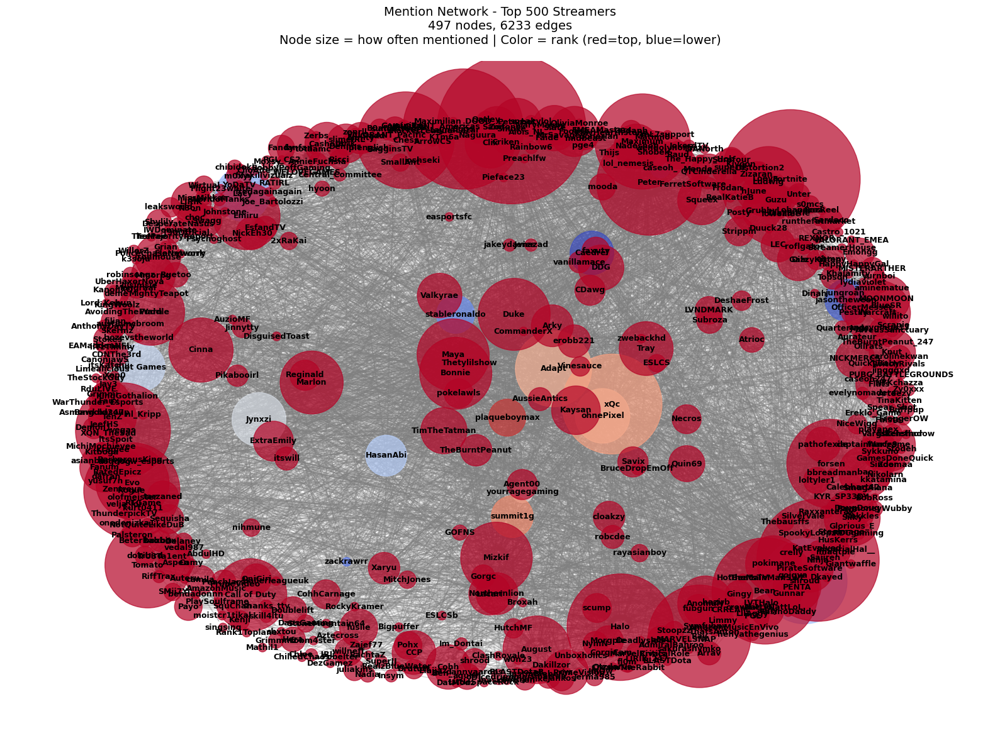


✓ Visualization saved as 'mention_network_top20.png'


In [15]:
# Visualize the mention network
if G.number_of_edges() > 0:
    plt.figure(figsize=(16, 12))
    
    # Layout
    pos = nx.spring_layout(G, k=3, iterations=50, seed=42)
    
    # Node sizes based on in-degree (how much they're mentioned)
    in_degrees = dict(G.in_degree())
    node_sizes = [max(100, in_degrees[node] * 100) for node in G.nodes()]
    
    # Node colors based on rank
    ranks = [G.nodes[node]['rank'] for node in G.nodes()]
    
    # Draw
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=ranks, 
                          cmap='coolwarm', alpha=0.7, vmin=1, vmax=20)
    
    # Draw edges with varying thickness based on mention count
    edge_weights = [G[u][v]['mentions'] for u, v in G.edges()]
    max_weight = max(edge_weights) if edge_weights else 1
    edge_widths = [1 + (w / max_weight) * 3 for w in edge_weights]
    
    nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.3, 
                          arrowsize=10, arrowstyle='->', edge_color='gray')
    
    # Labels
    labels = {node: G.nodes[node]['display_name'] for node in G.nodes()}
    nx.draw_networkx_labels(G, pos, labels, font_size=9, font_weight='bold')
    
    plt.title(f'Mention Network - Top {TOP_N} Streamers\n' +
             f'{G.number_of_nodes()} nodes, {G.number_of_edges()} edges\n' +
             f'Node size = how often mentioned | Color = rank (red=top, blue=lower)',
             fontsize=14, pad=20)
    plt.axis('off')
    plt.tight_layout()
    
    plt.savefig('mention_network_top20.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("\n✓ Visualization saved as 'mention_network_top20.png'")
else:
    print("Cannot visualize - no edges in network")

## Summary

**What We Built:**
- Directed mention network of top 20 Twitch streamers
- Analyzed 3 VODs per streamer (60 total VODs)
- Extracted cross-mentions from chat logs
- Edge weights = number of times streamer B is mentioned in streamer A's chat

**Key Findings:**
- See which streamers are discussed most across communities
- Identify influential streamers who get mentioned often
- Discover which communities are aware of each other
- Network can reveal bridging streamers between different game communities

**Files Created:**
- `mention_network_top20.graphml` - Network graph
- `mention_network_top20_nodes.csv` - Node data
- `mention_network_top20_edges.csv` - Edge data with mention counts
- `mention_network_top20_metrics.json` - Network statistics
- `mention_network_vods.csv` - List of downloaded VODs
- Chat logs in `mention_network_chats/` folder